In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import cv2
import math
from google.colab.patches import cv2_imshow
from collections import defaultdict
import matplotlib.pyplot as plt

#Problem 1
Decompose the Building image (Fig.1) into 8 bit planes. Show the bit planes. Then reconstruct the image back by removing three least significant bit planes. What will happen if you reconstruct the image by removing three most significant bit planes?

All 8 bit planes


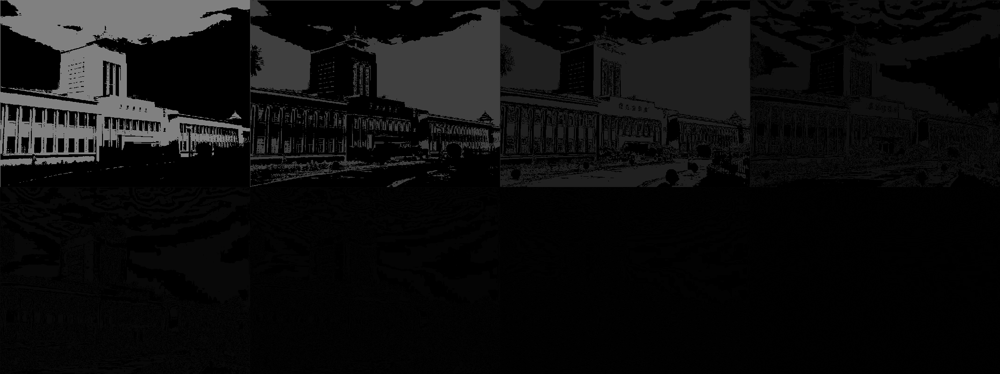



Image Reconstructed after removing 3 least significant bit planes


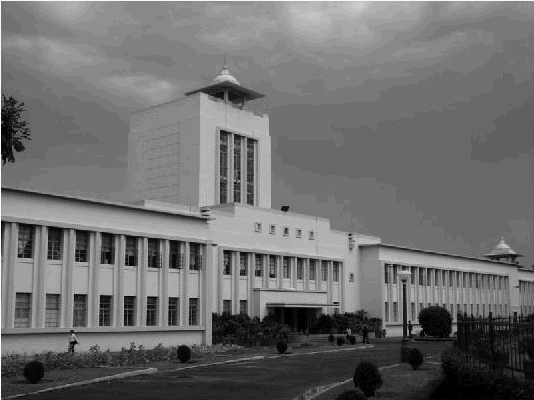



Image Reconstructed after removing 3 most significant bit planes


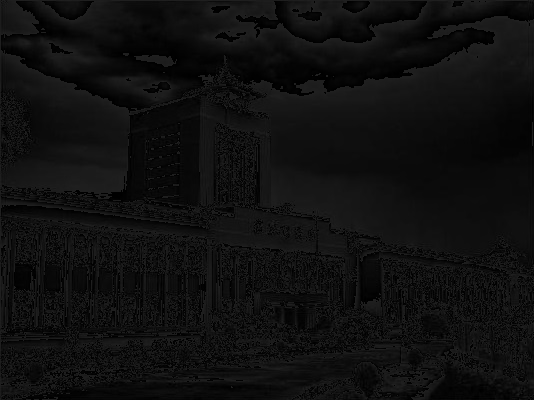

In [ ]:
# Read the image in greyscale
Q1_img = cv2.imread('/content/drive/MyDrive/AIP/A3/building.jpg',0)

#Iterate over each pixel and change pixel value to binary using np.binary_repr() and store it in a list.
lst = []
for i in range(Q1_img.shape[0]):
    for j in range(Q1_img.shape[1]):
         lst.append(np.binary_repr(Q1_img[i][j] ,width=8)) # width = no. of bits

# We have a list of strings where each string represents binary pixel value. To extract bit planes we need to iterate over the strings and store the characters corresponding to bit planes into lists.
# Multiply with 2^(n-1) and reshape to reconstruct the bit image.
eight_bit_img = (np.array([int(i[0]) for i in lst],dtype = np.uint8) * 128).reshape(Q1_img.shape[0],Q1_img.shape[1])
seven_bit_img = (np.array([int(i[1]) for i in lst],dtype = np.uint8) * 64).reshape(Q1_img.shape[0],Q1_img.shape[1])
six_bit_img = (np.array([int(i[2]) for i in lst],dtype = np.uint8) * 32).reshape(Q1_img.shape[0],Q1_img.shape[1])
five_bit_img = (np.array([int(i[3]) for i in lst],dtype = np.uint8) * 16).reshape(Q1_img.shape[0],Q1_img.shape[1])
four_bit_img = (np.array([int(i[4]) for i in lst],dtype = np.uint8) * 8).reshape(Q1_img.shape[0],Q1_img.shape[1])
three_bit_img = (np.array([int(i[5]) for i in lst],dtype = np.uint8) * 4).reshape(Q1_img.shape[0],Q1_img.shape[1])
two_bit_img = (np.array([int(i[6]) for i in lst],dtype = np.uint8) * 2).reshape(Q1_img.shape[0],Q1_img.shape[1])
one_bit_img = (np.array([int(i[7]) for i in lst],dtype = np.uint8) * 1).reshape(Q1_img.shape[0],Q1_img.shape[1])

#Concatenate these images for ease of display using cv2.hconcat()
finalr = cv2.hconcat([eight_bit_img,seven_bit_img,six_bit_img,five_bit_img])
finalv =cv2.hconcat([four_bit_img,three_bit_img,two_bit_img,one_bit_img])

# Vertically concatenate
final = cv2.vconcat([finalr,finalv])

# Display the images
print("All 8 bit planes")
cv2_imshow(final)


Q1_reconstruct_1 = eight_bit_img+seven_bit_img+six_bit_img+five_bit_img+four_bit_img
print("\n\nImage Reconstructed after removing 3 least significant bit planes")
cv2_imshow(Q1_reconstruct_1)

Q1_reconstruct_2 = five_bit_img+four_bit_img+three_bit_img+two_bit_img+one_bit_img;
print("\n\nImage Reconstructed after removing 3 most significant bit planes")
cv2_imshow(Q1_reconstruct_2)



#Problem 2

Write a program which will transform a given image (Fig.2(a)) in such way that the resultant image histogram is equivalent to histogram of another image (Fig.2 (b)). In the process, show the individual histograms and the intensity transformation curve.
[Hint: Use the histogram specification algorithm].

In [ ]:
def generatehistogram(Img):
  #convert to grayscale
  #Img= cv2.cvtColor(Img, cv2.COLOR_RGB2GRAY);
  #cv2_imshow(Img )
  #print(Img.shape)
  #print(type(Img))

  
  #256 Disitnct  intensity levels ( 0 - 255 )

  LL=list(range(0,256));
  #print(LL)

  HistogramCount= defaultdict(int);

  for i in LL:
    HistogramCount[i]=0;

  R,C=Img.shape;

  for x in range(0,R):
    for y in range(0,C):
      HistogramCount[Img[x][y]]=HistogramCount[Img[x][y]]+1;
      #print("heerre")

  #print(HistogramCount)

  return HistogramCount



def transformationFunc(prob):
    L = prob.shape[0] # No. of intensity levels
    Sk = np.array([L]*L)
    for i in range(L):
        summ = 0
        for j in range(0,i+1):
            summ += prob[j]
        Sk[i] = Sk[i]*summ
        if (Sk[i] - int(Sk[i])) > 0.5:
            Sk[i] = Sk[i] + 1
        if Sk[i] > 255.0:  # clipping
            Sk[i] = 255.0
    Sk = Sk.astype('int')
    return Sk

def closest(val, arr):
    index = np.abs(arr - val).argmin()
    return index


(264, 339)
(300, 300)
einstein


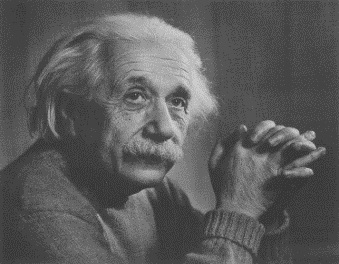

lena


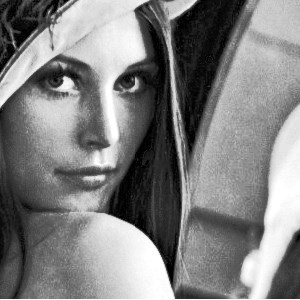

total no. of pixels ;  89496
Probabilty At Each Intensity Level :  [(0, 0.0), (1, 0.0), (2, 0.0), (3, 0.0), (4, 0.0), (5, 0.0), (6, 0.0), (7, 0.0), (8, 0.0), (9, 0.0), (10, 0.0), (11, 0.0), (12, 0.0), (13, 0.0), (14, 0.0), (15, 0.0), (16, 0.0), (17, 0.0), (18, 0.0), (19, 0.0), (20, 0.0), (21, 0.0), (22, 0.0), (23, 0.0), (24, 0.0), (25, 0.0), (26, 0.0), (27, 0.0), (28, 0.0), (29, 0.0), (30, 0.0), (31, 0.0), (32, 0.0), (33, 0.0), (34, 0.0), (35, 0.0), (36, 0.0), (37, 0.0), (38, 0.0), (39, 0.0), (40, 0.0), (41, 0.0), (42, 0.0), (43, 0.0), (44, 0.0), (45, 0.0), (46, 1.1173683740055422e-05), (47, 0.00013408420488066506), (48, 0.0003575578796817735), (49, 0.001061499955305265), (50, 0.0020559578081701976), (51, 0.005039331366764995), (52, 0.008313220702601234), (53, 0.012514525788862071), (54, 0.014090015196209886), (55, 0.013877715205148834), (56, 0.01098373111647448), (57, 0.007285241798516135), (58, 0.00397783141145973), (59, 0.0018436578171091445), (60, 0.0009162420666845446), (61, 0.000

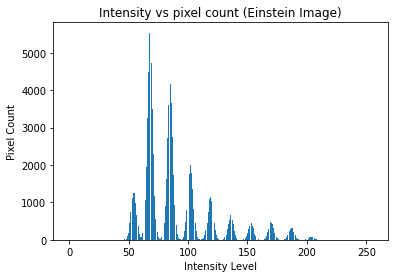

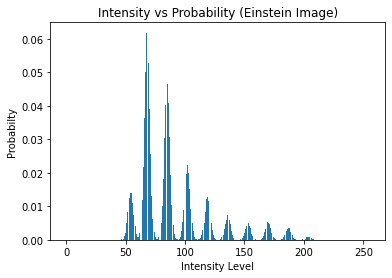

total no. of pixels ;  90000
Probabilty At Each Intensity Level :  [(0, 0.007188888888888889), (1, 0.002822222222222222), (2, 0.002811111111111111), (3, 0.0033), (4, 0.0028555555555555556), (5, 0.0035666666666666668), (6, 0.003766666666666667), (7, 0.004288888888888889), (8, 0.004366666666666666), (9, 0.004988888888888889), (10, 0.005111111111111111), (11, 0.005622222222222222), (12, 0.0051333333333333335), (13, 0.005266666666666667), (14, 0.0051), (15, 0.004844444444444445), (16, 0.004411111111111111), (17, 0.004011111111111111), (18, 0.0031888888888888887), (19, 0.003322222222222222), (20, 0.0033444444444444446), (21, 0.0032222222222222222), (22, 0.0031555555555555555), (23, 0.0037222222222222223), (24, 0.003577777777777778), (25, 0.004033333333333333), (26, 0.0038888888888888888), (27, 0.003955555555555556), (28, 0.004055555555555555), (29, 0.0034111111111111113), (30, 0.003511111111111111), (31, 0.0032555555555555554), (32, 0.003533333333333333), (33, 0.0036555555555555556), (34, 0

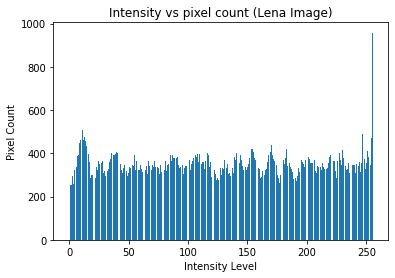

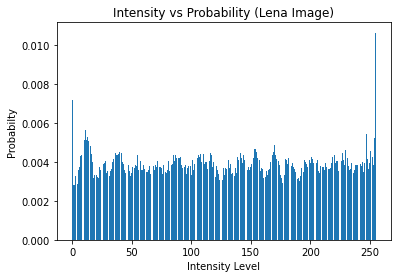

Image after histogram specification


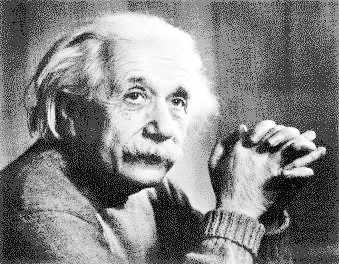

total no. of pixels ;  89496
Probabilty At Each Intensity Level :  [(0, 0.008659604898542951), (1, 0.0), (2, 0.0), (3, 0.008313220702601234), (4, 0.0), (5, 0.0), (6, 0.0), (7, 0.012514525788862071), (8, 0.0), (9, 0.0), (10, 0.014090015196209886), (11, 0.0), (12, 0.0), (13, 0.013877715205148834), (14, 0.01098373111647448), (15, 0.0), (16, 0.007285241798516135), (17, 0.00397783141145973), (18, 0.0037096630016984), (19, 0.002011263073209976), (20, 0.005508626083847323), (21, 0.0), (22, 0.0), (23, 0.0), (24, 0.011743541610798248), (25, 0.0), (26, 0.0), (27, 0.0), (28, 0.0), (29, 0.0), (30, 0.021710467506927685), (31, 0.0), (32, 0.0), (33, 0.0), (34, 0.0), (35, 0.0), (36, 0.0), (37, 0.0), (38, 0.0), (39, 0.03648207741128095), (40, 0.0), (41, 0.0), (42, 0.0), (43, 0.0), (44, 0.0), (45, 0.0), (46, 0.0), (47, 0.0), (48, 0.0), (49, 0.0), (50, 0.0), (51, 0.0), (52, 0.050058103155448286), (53, 0.0), (54, 0.0), (55, 0.0), (56, 0.0), (57, 0.0), (58, 0.0), (59, 0.0), (60, 0.0), (61, 0.0), (62, 0.0),

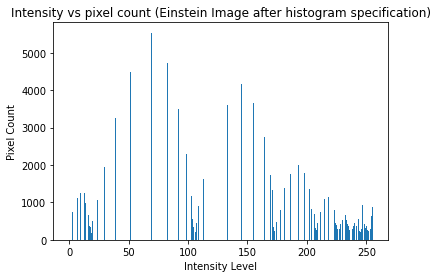

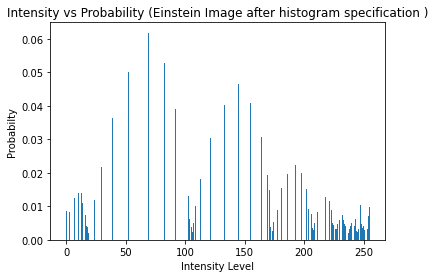

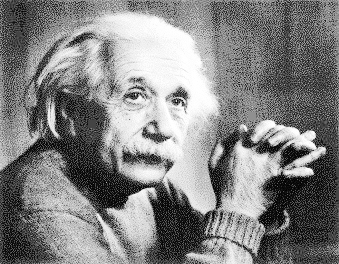

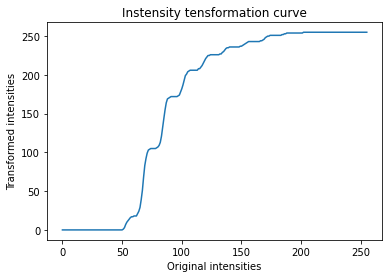

In [ ]:
einstein = cv2.imread('/content/drive/MyDrive/AIP/A3/einstein.jpg', 0)
lena = cv2.imread('/content/drive/MyDrive/AIP/A3/Lena.jpg', 0)
print(einstein.shape)
print(lena.shape)

print("einstein")
cv2_imshow(einstein);

print("lena")
cv2_imshow(lena);


##----------------------------------------------
##Einstein 

histA=generatehistogram(einstein);

A_x=list(histA.keys());
A_y_cnt=list(histA.values());

#probability distribution
totalPixel=sum(A_y_cnt);
print("total no. of pixels ; ", totalPixel) # also verified as img.shape[0]*img.shape[1]

A_y_prob = [ll / totalPixel for ll in A_y_cnt];

ProbabiltyAtEachIntensityLevel= list(zip(A_x, A_y_prob));

print("Probabilty At Each Intensity Level : ", ProbabiltyAtEachIntensityLevel)

print("\n\nB. ==========================================")
plt.figure();
plt.bar(A_x, A_y_cnt)
plt.xlabel('Intensity Level')
plt.ylabel('Pixel Count')
plt.title("Intensity vs pixel count (Einstein Image)")

plt.show()

plt.figure();
plt.bar(A_x, A_y_prob)
plt.xlabel('Intensity Level')
plt.ylabel('Probabilty')
plt.title("Intensity vs Probability (Einstein Image)")
plt.show()

einstein_img_prob = A_y_prob;



##-------------


##----------------------------------------------
##lena

histA=generatehistogram(lena);

A_x=list(histA.keys());
A_y_cnt=list(histA.values());

#probability distribution
totalPixel=sum(A_y_cnt);
print("total no. of pixels ; ", totalPixel) # also verified as img.shape[0]*img.shape[1]

A_y_prob = [ll / totalPixel for ll in A_y_cnt];

ProbabiltyAtEachIntensityLevel= list(zip(A_x, A_y_prob));

print("Probabilty At Each Intensity Level : ", ProbabiltyAtEachIntensityLevel)

print("\n\nB. ==========================================")
plt.figure();
plt.bar(A_x, A_y_cnt)
plt.xlabel('Intensity Level')
plt.ylabel('Pixel Count')
plt.title("Intensity vs pixel count (Lena Image)")

plt.show()

plt.figure();
plt.bar(A_x, A_y_prob)
plt.xlabel('Intensity Level')
plt.ylabel('Probabilty')
plt.title("Intensity vs Probability (Lena Image)")
plt.show()

lena_img_prob = A_y_prob


##-----------------------

print("======================================================")
print("Image after histogram specification")

def get_nearest(my_array, target):
    diff = my_array - target
    mask = np.ma.less_equal(diff, -1)
    # We need to mask the negative differences
    # since we are looking for values above
    if np.all(mask):
        c = np.abs(diff).argmin()
        return c # returns min index of the nearest if target is greater than any value
    masked_diff = np.ma.masked_array(diff, mask)
    return masked_diff.argmin()



def my_hist_match(original, specified):
 
    oldshape = original.shape
    original = original.ravel()
    specified = specified.ravel()
 
    # get the set of unique pixel values and their corresponding indices and counts
    s_values, bin_idx, s_counts = np.unique(original, return_inverse=True,return_counts=True)
    t_values, t_counts = np.unique(specified, return_counts=True)
 
    # Calculate s_k for original image
    s_quantiles = np.cumsum(s_counts).astype(np.float64)
    s_quantiles /= s_quantiles[-1]
    
    # Calculate s_k for specified image
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]
 
    # Round the values
    sour = np.around(s_quantiles*255)
    temp = np.around(t_quantiles*255)
    
    # Map the rounded values
    b=[]
    for data in sour[:]:
        b.append(get_nearest(temp,data))
    b= np.array(b,dtype='uint8')
 
    return b[bin_idx].reshape(oldshape)

# perform Histogram Matching
my_specified= my_hist_match(einstein, lena)
 
# Display the image
cv2_imshow(np.array(my_specified,dtype='uint8'))



##----------------------------------------------
##lenaEinstein 

histA=generatehistogram(my_specified);

A_x=list(histA.keys());
A_y_cnt=list(histA.values());

#probability distribution
totalPixel=sum(A_y_cnt);
print("total no. of pixels ; ", totalPixel) # also verified as img.shape[0]*img.shape[1]

A_y_prob = [ll / totalPixel for ll in A_y_cnt];

ProbabiltyAtEachIntensityLevel= list(zip(A_x, A_y_prob));

print("Probabilty At Each Intensity Level : ", ProbabiltyAtEachIntensityLevel)

print("\n\nB. ==========================================")
plt.figure();
plt.bar(A_x, A_y_cnt)
plt.xlabel('Intensity Level')
plt.ylabel('Pixel Count')
plt.title("Intensity vs pixel count (Einstein Image after histogram specification)")

plt.show()

plt.figure();
plt.bar(A_x, A_y_prob)
plt.xlabel('Intensity Level')
plt.ylabel('Probabilty')
plt.title("Intensity vs Probability (Einstein Image after histogram specification )")
plt.show()


##-----------------------

print("======================================================")



Sk = transformationFunc(np.array(einstein_img_prob))
Gz = transformationFunc(np.array(lena_img_prob))
#print(Sk)
print("==========================================")
#print(Gz)


transformed = []
for l in range(256):
    transformed.append(closest(Sk[l],Gz))
transformed = np.array(transformed).astype('uint8')
#transformed

for i in range(einstein.shape[0]):
    einstein[i] = transformed[einstein[i]]
einstein_trans = einstein.reshape(einstein.shape[0],einstein.shape[1])

cv2_imshow(einstein_trans)

plt.figure();
plt.plot(list(range(0,256)), transformed)
plt.xlabel('Original intensities')
plt.ylabel('Transformed intensities')
plt.title("Instensity tensformation curve")
plt.show()





JUST TO CHECK WITH ALREADY EXISTING FUNCTION

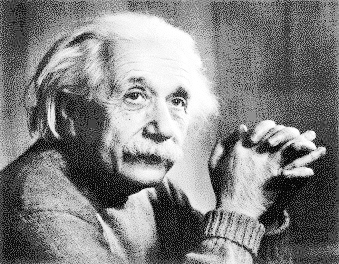

In [ ]:
from skimage import exposure
hist_specified_image = exposure.match_histograms(einstein, lena);

cv2_imshow(hist_specified_image);


#Problem 3

Perform gamma transformation and histogram equalization (separately) on the given hazy
image (Fig. 3 (a)) to enhance the contrast of the image. Choose the parameter (if any) of
these transformations such that the resultant images have dehazing effects. Fuse both the
images to generate a single image such that it has better visual appearance. Note that the
objective is to get a better dehazed result. Now, consider the haze model

I(x) = J(x)t(x) + A(1 − t(x)),

where I(x) is the given hazy image. J(x) can be approximated with resultant image that

have been generated by fusing the results of gamma transformation and histogram equal-
ization. Assume the atmospheric light is A = [0.8159, 0.8186, 0.8272]. Now estimate the

transmission map t(x) using the above equation. To see the accuracy of the results, compute
the Euclidean distance between the estimated transmission map and the given transmission
map (Fig.3(b)). A lower distance indicates a better dehazing result.



Original Image


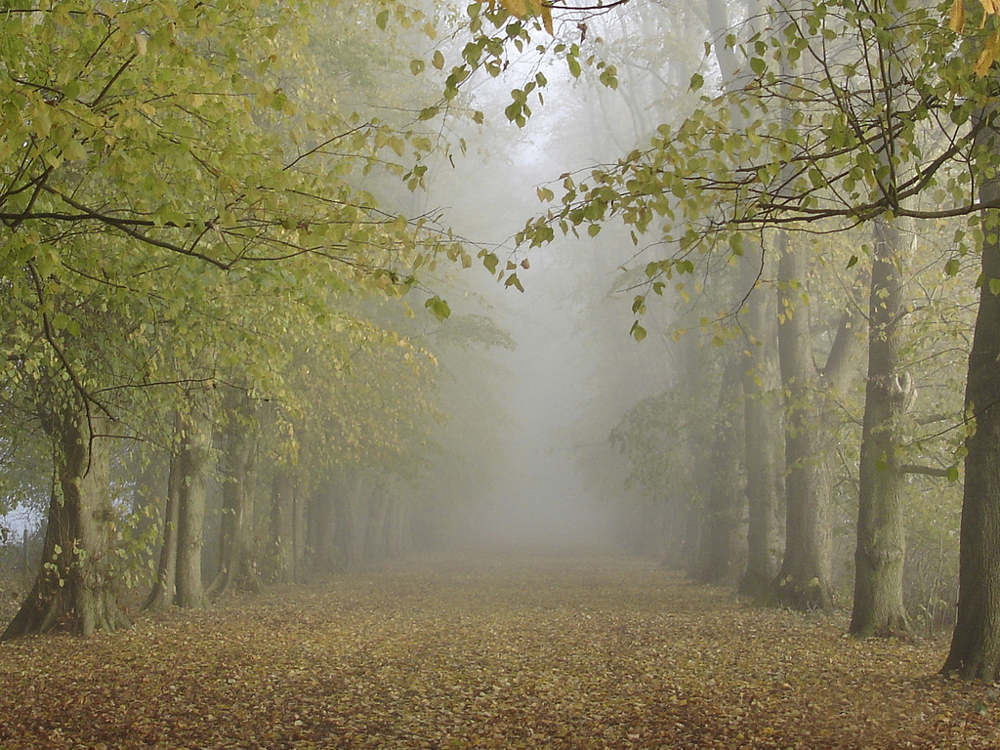

Gamma transformed Image


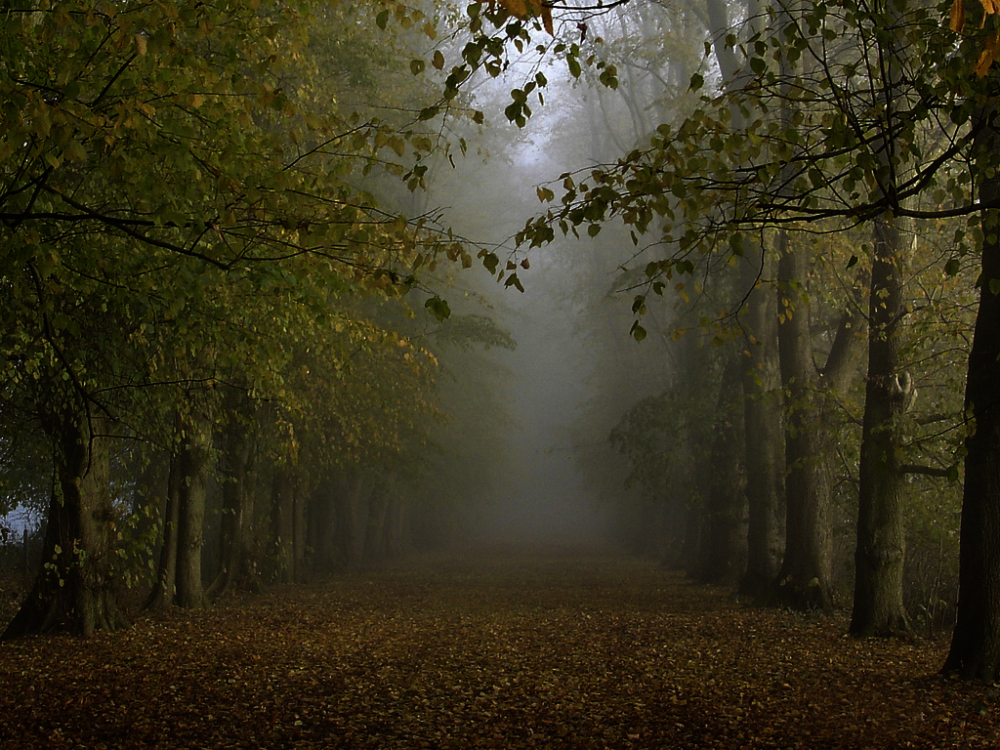

In [ ]:

forest = cv2.imread("/content/drive/MyDrive/AIP/A3/forest.jpg")
print("Original Image")
cv2_imshow(forest)


gamma=2.5
image1_g = ((forest/255)**(gamma))*255

print("Gamma transformed Image")
cv2_imshow(image1_g)


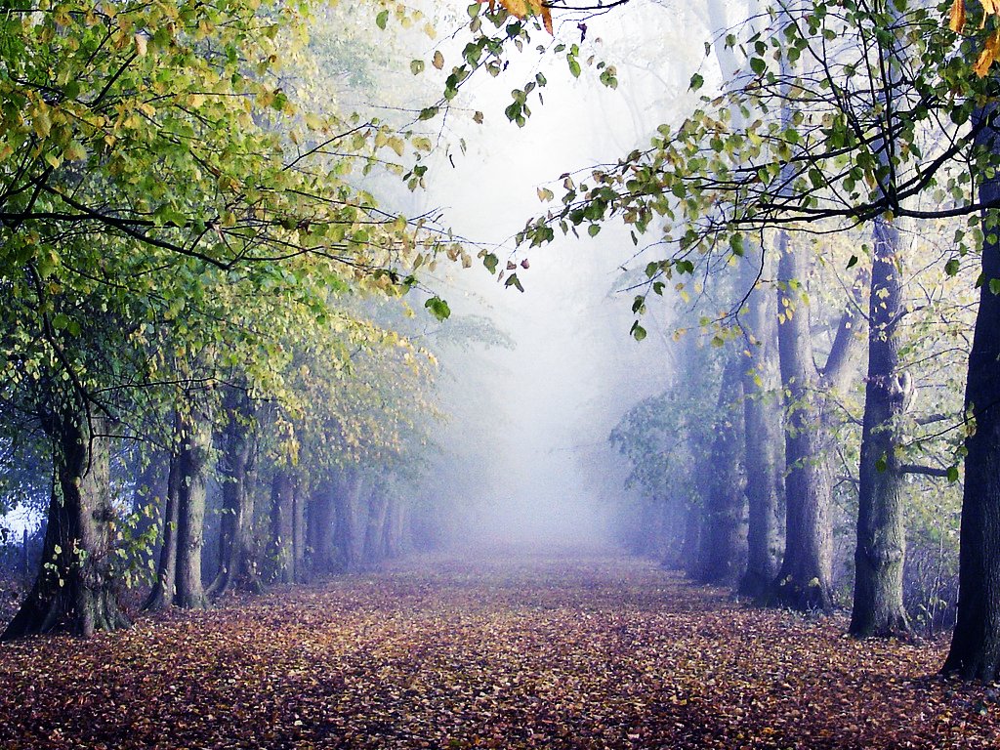

In [ ]:
#Contrast stretching using histogram streching 
blue=np.zeros([256])
green=np.zeros([256])
red=np.zeros([256])
for i in range(forest.shape[0]):
  for j in range(forest.shape[1]):
    blue[forest[i][j][0]]+=1
    green[forest[i][j][1]]+=1
    red[forest[i][j][2]]+=1


tot_pix = forest.shape[0]*forest.shape[1]
blue,green,red = blue/tot_pix,green/tot_pix,red/tot_pix    


blue_cdf=np.zeros([256])
green_cdf=np.zeros([256])
red_cdf=np.zeros([256])

for i in range(256):
  blue_cdf[i]=np.sum(blue[:i+1])
  green_cdf[i]=np.sum(green[:i+1])
  red_cdf[i]=np.sum(red[:i+1])


blue_cdf = blue_cdf*255
green_cdf = green_cdf*255
red_cdf = red_cdf*255


forestnew=np.zeros([forest.shape[0],forest.shape[1],3])
for i in range(forest.shape[0]):
  for j in range(forest.shape[1]):
    forestnew[i][j][0]=blue_cdf[forest[i][j][0]]
    forestnew[i][j][1]=green_cdf[forest[i][j][1]]
    forestnew[i][j][2]=red_cdf[forest[i][j][2]]


cv2_imshow(forestnew)     

Image after gamma transformation and contrast streching using histogram equalization


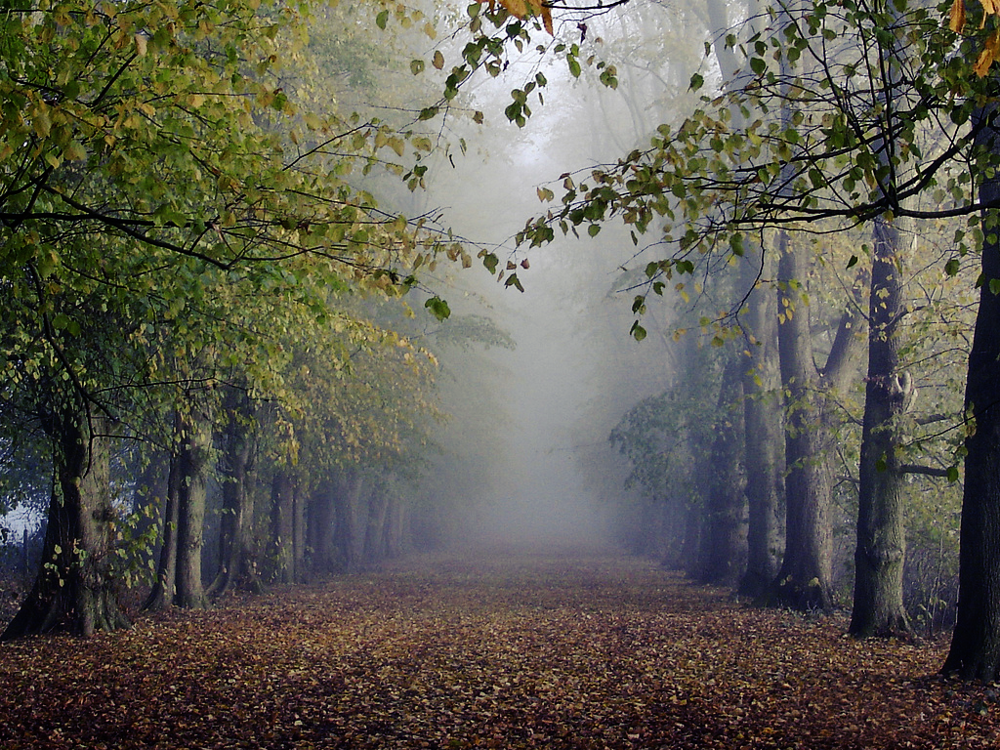

In [ ]:
both = (forestnew + image1_g)//2
print("Image after gamma transformation and contrast streching using histogram equalization")
cv2_imshow(both)

In [ ]:
# I = forest.copy()
# J = both.copy()
# A = np.array([0.8159, 0.8186, 0.8272])
# I[:,:,0] = I[:,:,0] - A[2]
# I[:,:,1] = I[:,:,1] - A[1]
# I[:,:,2] = I[:,:,2] - A[0]

# J[:,:,0] = J[:,:,0] - A[2]
# J[:,:,1] = J[:,:,1] - A[1]
# J[:,:,2] = J[:,:,2] - A[0]

# t = I/(J)


I = forest.copy()
J = both.copy()
A = np.array([0.8159, 0.8186, 0.8272])
I[:,:,0] = I[:,:,0] - A[0]
I[:,:,1] = I[:,:,1] - A[1]
I[:,:,2] = I[:,:,2] - A[2]

J[:,:,0] = J[:,:,0] - A[0]
J[:,:,1] = J[:,:,1] - A[1]
J[:,:,2] = J[:,:,2] - A[2]

t = I/(J)


# I = forest.copy()
# J = both.copy()
# A = np.array([0.8159, 0.8186, 0.8272])
# I[:,:,0] = I[:,:,0] - A[0]
# I[:,:,1] = I[:,:,1] - A[0]
# I[:,:,2] = I[:,:,2] - A[0]

# J[:,:,0] = J[:,:,0] - A[0]
# J[:,:,1] = J[:,:,1] - A[0]
# J[:,:,2] = J[:,:,2] - A[0]

# t = I/(J)

transmission map


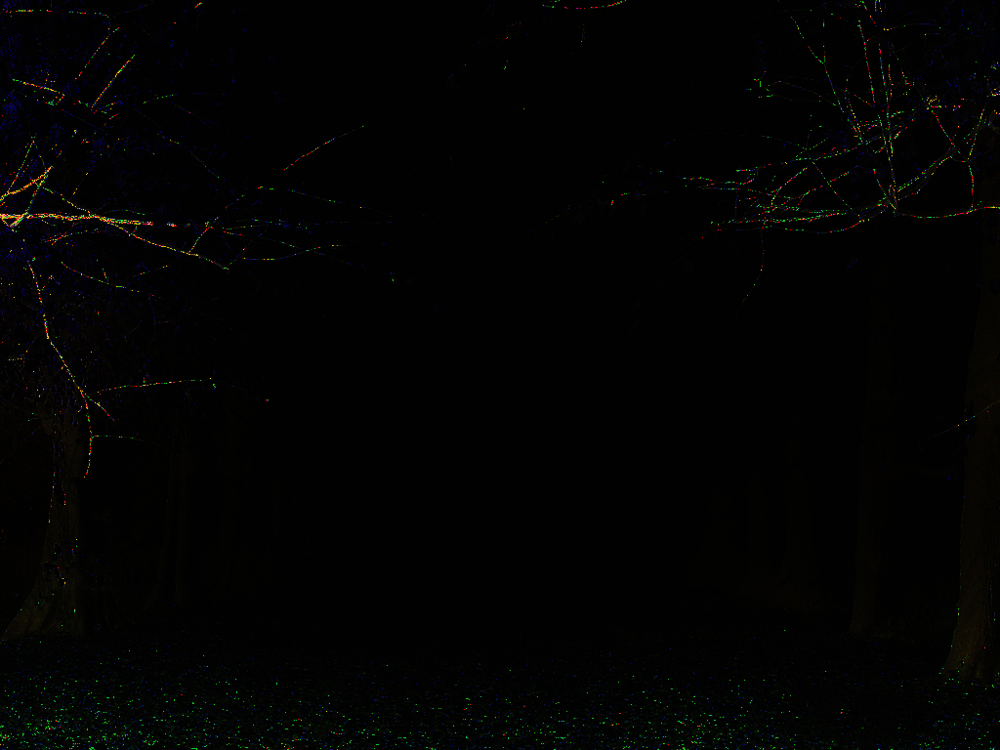

Re-scaled transformation map


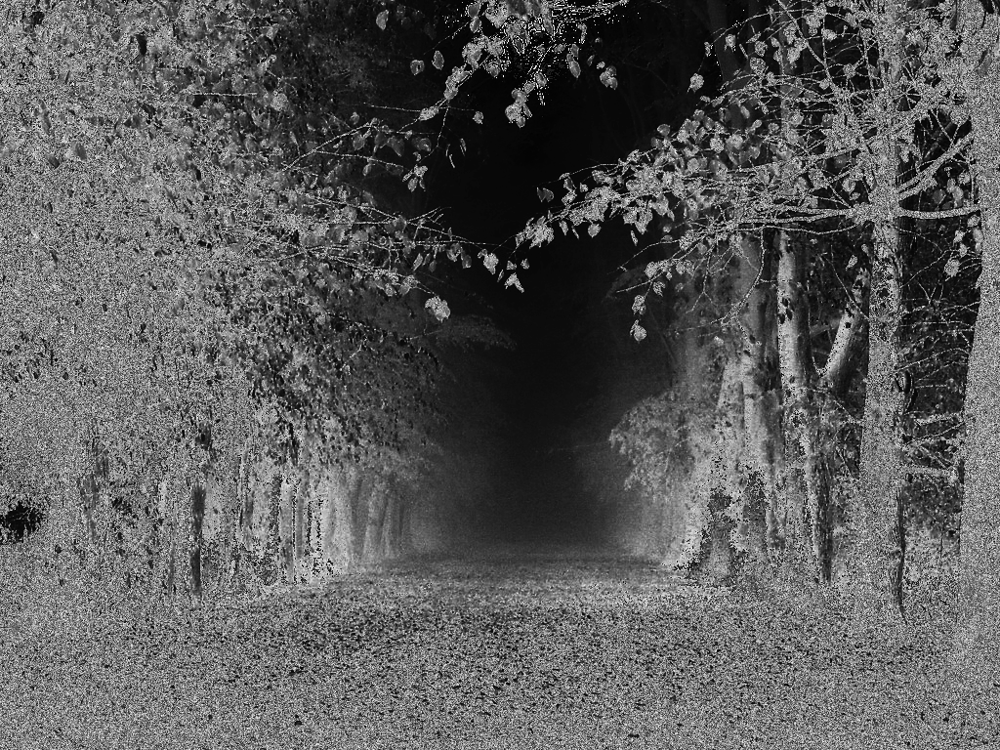

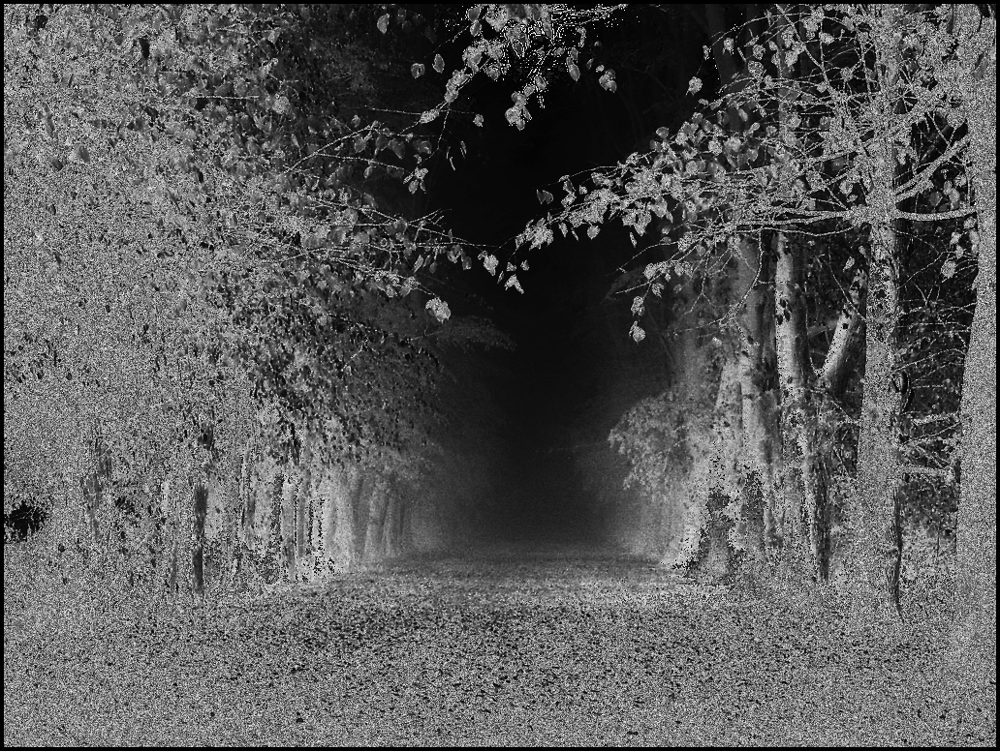

(776, 1032)


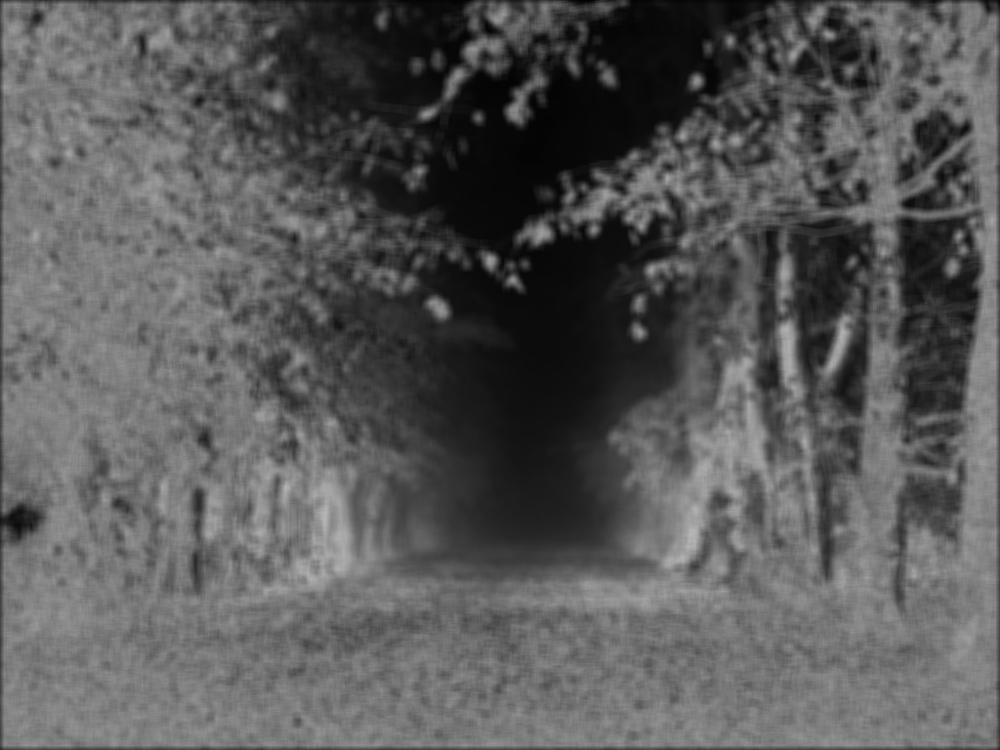

(768, 1024)


In [ ]:
print("transmission map")
cv2_imshow(t)

tt = (t*255).astype('uint8')
transformation_gray = cv2.cvtColor(tt,cv2.COLOR_BGR2GRAY)


print("Re-scaled transformation map")
cv2_imshow(transformation_gray.astype('uint8'))


##SMOOTHENING
def padding1(img, pad):
    h = img.shape[0]
    w = img.shape[1]
    padded_img = np.zeros((h+2*pad,w+2*pad))
    for i in range(h):
        for j in range(w):
            padded_img[i+pad,j+pad] = img[i,j]
    return padded_img

###### creating avg kernel of given size
def avgKernel1(filter_size):
    avg_mask = np.array([[1/(filter_size**2)]*filter_size for _ in range(filter_size)])
    return avg_mask

def convolution2d1(img, kernel, pad):
    h = img.shape[0]
    w = img.shape[1]
    kernel_hw = kernel.shape[0]
    out = np.zeros((h-2*pad, w-2*pad))
    for i in range(out.shape[0]):
        for j in range(out.shape[1]):
            out[i][j] = np.sum(kernel*img[i:i+kernel_hw,j:j+kernel_hw])
    return out


padded_transformation_gray = padding1(transformation_gray, 4)
cv2_imshow(padded_transformation_gray)
print(padded_transformation_gray.shape)

avg_mask1 = avgKernel1(9)
conv_transformation_gray = convolution2d1(padded_transformation_gray, avg_mask1, 4)
cv2_imshow(conv_transformation_gray)
print(conv_transformation_gray.shape)


Given transformation map 


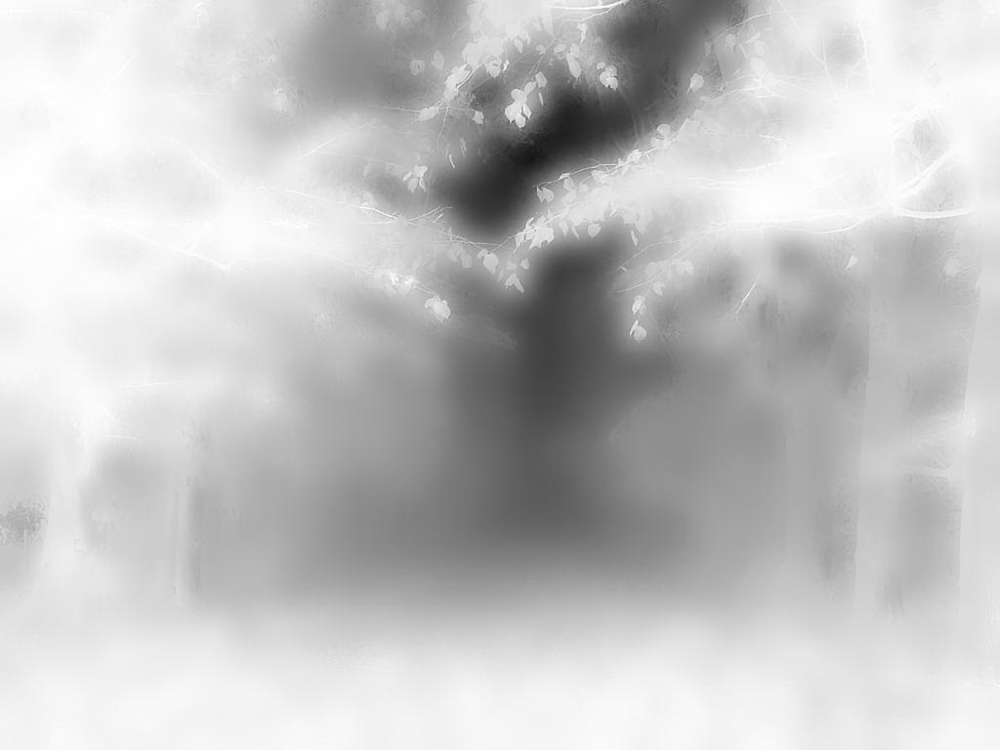

In [ ]:
given_trans = cv2.imread("/content/drive/MyDrive/AIP/A3/trans.jpg",0)
print("Given transformation map ")
cv2_imshow(given_trans)


In [ ]:
dist = np.linalg.norm(given_trans-conv_transformation_gray)

print("Euclidean distance : ", dist)


Euclidean distance :  100257.63778657356


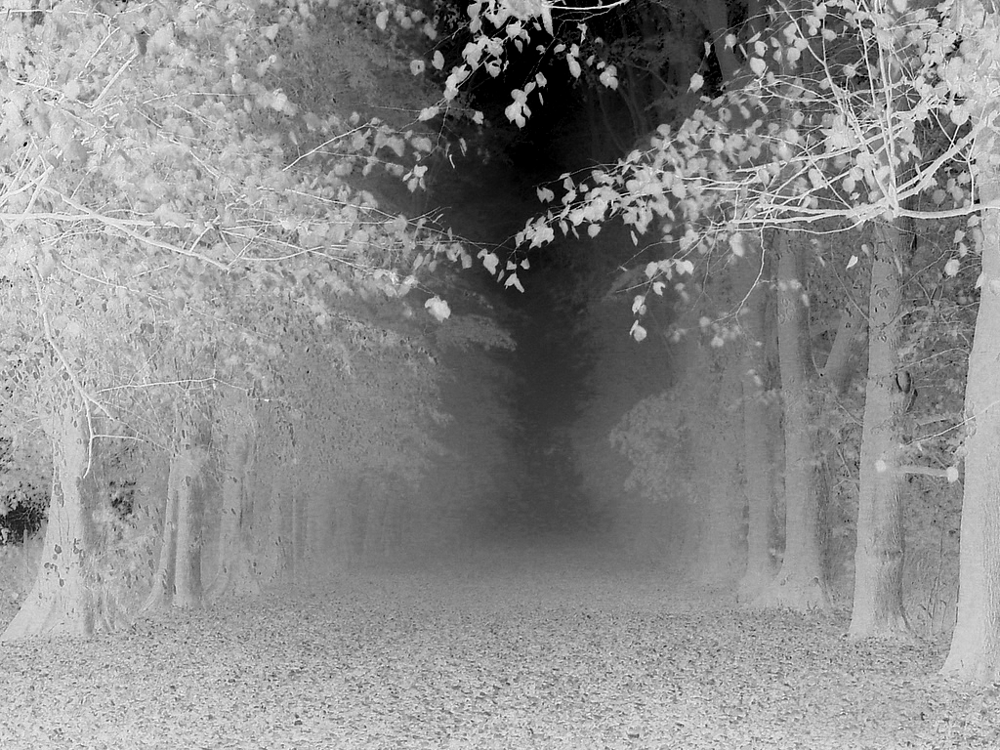

In [ ]:
conv_transformation_gray2 = np.zeros([forest.shape[0],forest.shape[1]])
A = np.array([0.8159, 0.8186, 0.8272])
for i in range(forest.shape[0]):
  for j in range(forest.shape[1]):
    m=9999999
    m=np.min(np.array([m,forest[i][j][0]/A[0],forest[i][j][1]/A[1],forest[i][j][2]/A[2]]))
    conv_transformation_gray2[i][j]=255-m

cv2_imshow(conv_transformation_gray2)

In [ ]:
dist2 = np.linalg.norm(given_trans-conv_transformation_gray2)

print("Euclidean distance : ", dist2)


Euclidean distance :  59554.89822652643


#Problem 4

Find out the difference between averaging operation and weighted averaging (higher weight
to center pixel) operation on Fig. 4 by applying spatial filtering. For this purpose, convolve
the image with 9 × 9 masks (averaging mask and weighted averaging mask).



In [ ]:
import math

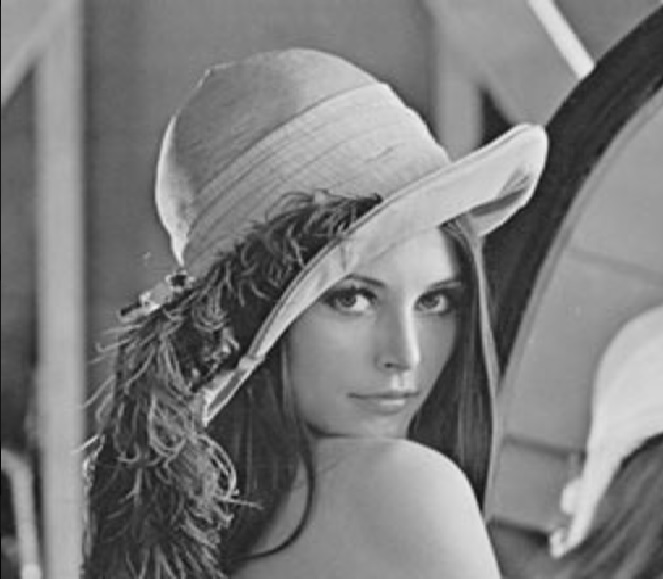

(579, 663)


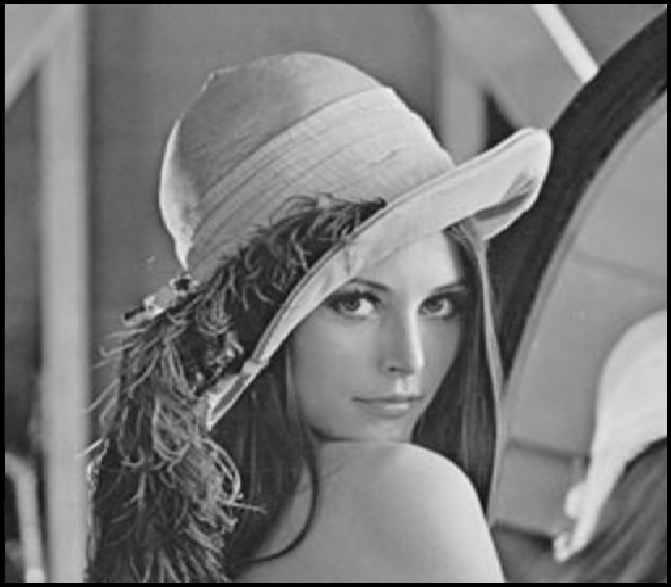

(587, 671)


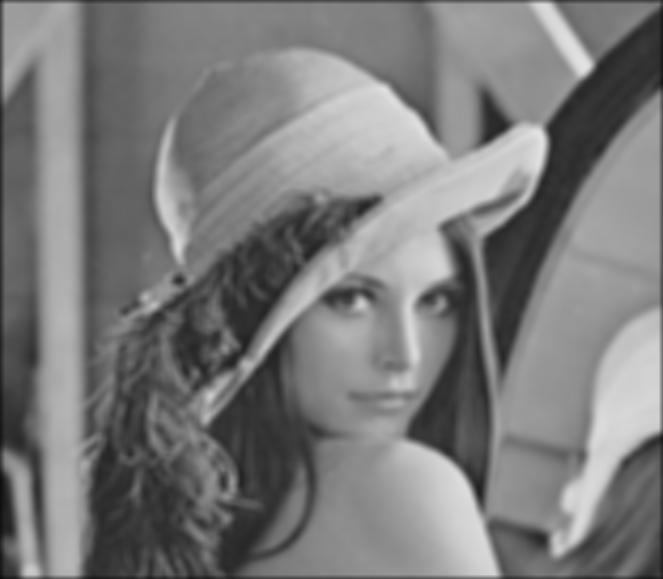

(579, 663)


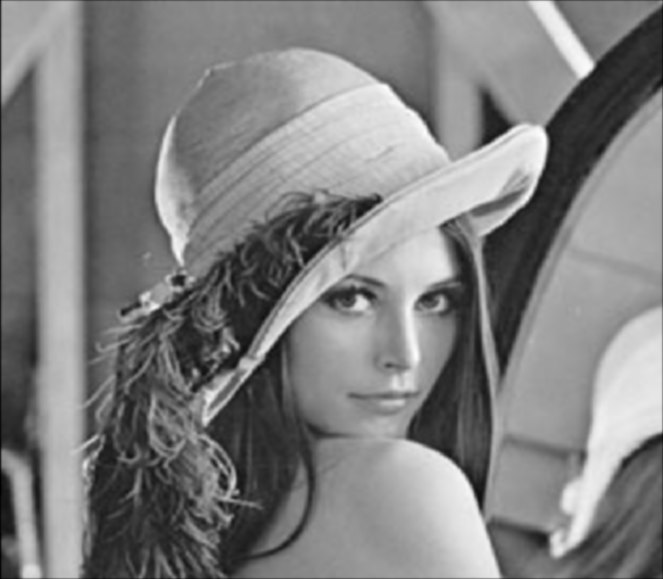

(579, 663)


In [ ]:
###### creating new padded image after including padding in height and width
def padding(img, pad):
    h = img.shape[0]
    w = img.shape[1]
    padded_img = np.zeros((h+2*pad,w+2*pad))
    for i in range(h):
        for j in range(w):
            padded_img[i+pad,j+pad] = img[i,j]
    return padded_img

###### creating avg kernel of given size
def avgKernel(filter_size):
    avg_mask = np.array([[1/(filter_size**2)]*filter_size for _ in range(filter_size)])
    return avg_mask

###### generating guassian kernel using it's formula
def gaussianKernel(size):
    gaussian_filter = np.zeros((size,size))
    sigma = 1
    PI = math.pi
    for i in range(gaussian_filter.shape[0]):
        for j in range(gaussian_filter.shape[0]):
            gaussian_filter[i,j] = np.exp(-((i-4)**2 + (j-4)**2)/2*sigma**2)/2*PI*(sigma**2)
    return gaussian_filter

###### perofrming convolution
def convolution2d(img, kernel, pad):
    h = img.shape[0]
    w = img.shape[1]
    kernel_hw = kernel.shape[0]
    out = np.zeros((h-2*pad, w-2*pad))
    for i in range(out.shape[0]):
        for j in range(out.shape[1]):
            out[i][j] = np.sum(kernel*img[i:i+kernel_hw,j:j+kernel_hw])
    return out

lena_face = cv2.imread("/content/drive/MyDrive/AIP/A3/lena_face.jpg",0)
cv2_imshow(lena_face)
print(lena_face.shape)

padded_lena = padding(lena_face, 4)
cv2_imshow(padded_lena)
print(padded_lena.shape)

avg_mask = avgKernel(9)
conv_lena = convolution2d(padded_lena, avg_mask, 4)
cv2_imshow(conv_lena)
print(conv_lena.shape)

gaussian_filter = gaussianKernel(9)
weighted_lena = convolution2d(padded_lena, gaussian_filter, 4)
weighted_lena = weighted_lena - np.min(weighted_lena)
weighted_lena = weighted_lena/np.max(weighted_lena)
weighted_lena *= 255
cv2_imshow(weighted_lena)
print(weighted_lena.shape)